In [6]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import random
import seaborn as sns
import time

import Simulation

from scipy.stats import arcsine
from tqdm import tqdm

uniform   = lambda: random.random(); uniform.__name__ = "uniform"
polarized = lambda: arcsine.rvs();   polarized.__name__ = "polarized"


In [25]:
def get_metric(graph, opinion):
    
    # avg

    return [
        np.nansum([abs(opinion[u] - opinion[v]) for v in graph.neighbors(u) if opinion[v] < 0.25])
        for u in graph.nodes()
    ]

    metrics = []
    polarity_score = []
    # neighbor_func = graph.neighbors if not nx.is_directed(graph) else graph.predecessors
    directed = nx.is_directed(graph)
    signal = lambda x: 1 if x >= 0.5 else 0
    for u in graph.nodes():
        neighbors = list(graph.neighbors(u))
        if not len(neighbors) > 0:
            continue 
        top = sum([signal(abs(opinion[u] - opinion[v])) for v in neighbors])
        metrics.append(top/len(neighbors))
        # metrics.extend([signal(abs(opinion[u] - opinion[v])) for v in neighbors])
        
    return metrics

In [26]:
data = {"Topology": [], "Opinion-Kind": [], "Community-Kind": [], "Metric": []}
topologies = ["amazon", "eu-core", "facebook"] #["amazon", "dblp", "eu-core", "facebook", "twitter"]
pbar = tqdm(total=len(topologies)*2*2, desc="Progress")
for topo_code in topologies:

    for opinion_func in [uniform, polarized]:
        graph, comm = Simulation.load_graph_and_communities(topo_code)
        opinion = Simulation.initialize_opinion(graph, distr_func=opinion_func)
        metrics = get_metric(graph, opinion)
        for metric in metrics:
            data["Topology"].append(topo_code)
            data["Opinion-Kind"].append(opinion_func.__name__)
            data["Community-Kind"].append("agnostic")
            data["Metric"].append(metric)
        pbar.update(1)
        
    for opinion_func in [uniform, polarized]:
        graph, comm = Simulation.load_graph_and_communities(topo_code)
        opinion = Simulation.initialize_opinion(graph, comm, distr_func=opinion_func)
        metrics = get_metric(graph, opinion)
        for metric in metrics:
            data["Topology"].append(topo_code)
            data["Opinion-Kind"].append(opinion_func.__name__)
            data["Community-Kind"].append("aware")
            data["Metric"].append(metric)
        pbar.update(1)





Progress:   0%|          | 0/12 [00:00<?, ?it/s]



Progress:   8%|▊         | 1/12 [00:19<03:38, 19.88s/it]



Progress:  17%|█▋        | 2/12 [00:53<04:00, 24.04s/it]



Progress:  25%|██▌       | 3/12 [01:13<03:24, 22.71s/it]



Progress:  33%|███▎      | 4/12 [01:48<03:32, 26.56s/it]



Progress:  42%|████▏     | 5/12 [01:49<02:11, 18.75s/it]



Progress:  50%|█████     | 6/12 [01:49<01:19, 13.21s/it]



Progress:  58%|█████▊    | 7/12 [01:49<00:46,  9.32s/it]



Progress:  67%|██████▋   | 8/12 [01:50<00:26,  6.61s/it]



Progress:  75%|███████▌  | 9/12 [01:50<00:14,  4.84s/it]



Progress:  83%|████████▎ | 10/12 [01:51<00:07,  3.73s/it]



Progress:  92%|█████████▏| 11/12 [01:52<00:02,  2.85s/it]



Progress: 100%|██████████| 12/12 [01:53<00:00,  2.28s/it]

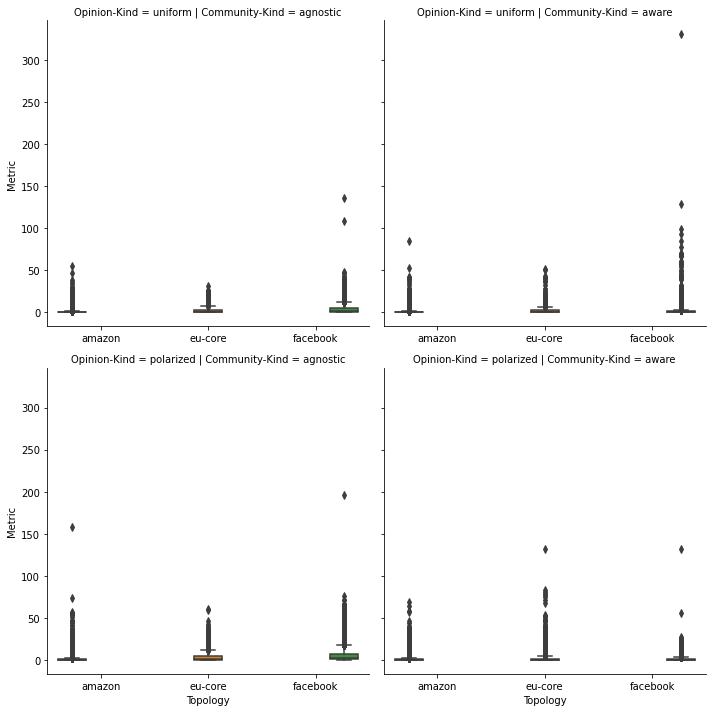

In [27]:
df = pd.DataFrame.from_dict(data)
sns.catplot(
    x="Topology",
    y="Metric",
    hue="Topology",
    kind="box",
    data=df,
    row="Opinion-Kind",
    col="Community-Kind",
    sharex=False,
    sharey=True,
)
plt.show()

In [28]:
from scipy import stats
from tabulate import tabulate

headers = ["Topology", "Opinion-Kind", "Community-Kind", "Sum", "Var", "Std", "Avg", "Shapiro", "IQR Range"]
table = []
test = lambda results: "AWARE" if abs(results) < 1 else "AGNOSTIC"

for topo in topologies:
    for op_kind in ["uniform", "polarized"]:
        for comm_kind in ["agnostic", "aware"]:
            query = f"Topology == '{topo}' and `Opinion-Kind` == '{op_kind}' and `Community-Kind` == '{comm_kind}'"
            x = list(df.query(query)["Metric"])
            # results = stats.skew(x)
            results = stats.normaltest(x)
            table.append([topo, op_kind, comm_kind, np.nansum(x), np.nanvar(x), np.nanstd(x), np.nanmean(x), stats.shapiro(x)[1], stats.iqr(x, nan_policy="omit")])

print(tabulate(table, headers))

Topology    Opinion-Kind    Community-Kind          Sum         Var        Std       Avg      Shapiro    IQR Range
----------  --------------  ----------------  ---------  ----------  ---------  --------  -----------  -----------
amazon      uniform         agnostic          183790       0.828001   0.909946  0.548851  0               0.737375
amazon      uniform         aware             173866       0.843625   0.918491  0.519216  0               0.704149
amazon      polarized       agnostic          272256       1.85431    1.36173   0.813036  0               0.956173
amazon      polarized       aware             257600       1.72153    1.31207   0.769269  0               0.950982
eu-core     uniform         agnostic            2327.19   14.2952     3.7809    2.31562   8.23543e-42     2.92251
eu-core     uniform         aware               2579.47   30.9275     5.56125   2.56664   0               2.59176
eu-core     polarized       agnostic            3815.3    44.7237     6.68758   3.

-0.19664535793577884


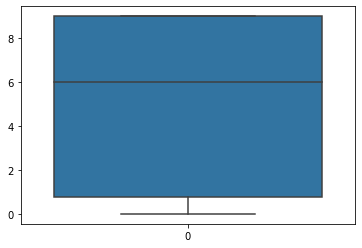

In [29]:
x = [9, 8, 0, 4, 1, 9, 9, 0]
print(stats.skew(x))
sns.boxplot(
    data=x
)
plt.show()
